## classification of music genre
### Mingjun Ma
### Brown University DSI
### https://github.com/MingjunMa/final_project

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv('music.csv')

In [3]:
df

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,72967.0,Justin Townes Earle,Ain’t Got No Money,37.0,0.418000,0.445,185096.0,0.655,0.000005,D,0.0829,-7.402,Minor,0.0694,108.406,4-Apr,0.620,Blues
1,91308.0,Arthur Conley,This Love of Mine,0.0,0.567000,0.517,204547.0,0.139,0.000012,F#,0.1180,-19.194,Major,0.0366,131.127,3-Apr,0.251,Blues
2,25574.0,Heartless Bastards,Into the Open,33.0,0.165000,0.306,264267.0,0.663,0.145000,C,0.1150,-5.299,Major,0.0331,151.10399999999998,4-Apr,0.255,Blues
3,61518.0,NaN,Never Coming Home,33.0,0.102000,0.596,207680.0,0.718,0.000000,A,0.2680,-5.266,Major,0.0314,130.509,4-Apr,0.711,Blues
4,56443.0,Gary Clark Jr.,Hold On,31.0,0.333000,0.492,226720.0,0.685,0.000019,A#,0.1200,-5.554,Minor,0.1180,173.375,4-Apr,0.705,Blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,32807.0,Catfish and the Bottlemen,Business,NaN,0.000243,NaN,221776.0,NaN,0.000855,A,0.0896,-3.727,Major,0.0503,142.015,4-Apr,0.368,Rock
2996,43645.0,Rick Astley,Never Gonna Give You Up,67.0,0.135000,0.727,212827.0,0.939,0.000044,G#,0.1510,-11.855,Major,0.0369,113.33,4-Apr,0.916,Rock
2997,57770.0,Imagine Dragons,Hopeless Opus,52.0,0.005410,0.627,238800.0,0.656,0.000096,D#,0.2150,-6.163,Major,0.0358,140.107,4-Apr,0.555,Rock
2998,48850.0,KONGOS,Take It From Me,53.0,0.055500,NaN,190771.0,0.740,0.000007,B,0.3060,-7.016,Minor,0.1750,?,4-Apr,0.761,Rock


### EDA

In [4]:
# It's obvious that this feature should be encoded.
# Group the data by "key" and count the occurrences of each key.
df_key = df.groupby(["key"])["key"].count()

# Import the necessary modules for plotting.
import plotly.express as px
import plotly.graph_objects as go

# Create a horizontal bar plot to visualize the count of each key.
fig = go.Figure(
    go.Bar(
        x=df_key.to_list(),
        y=df_key.index.to_list(),
        orientation="h",
        text=df_key.to_list(),
    )
)

# Set the title and height of the plot.
fig.update_layout(title="Count in each key", height=500)

# Customize the appearance of the bars.
fig.update_traces(
    textfont_size=12, textangle=0, textposition="outside", cliponaxis=False
)

# Display the plot.
fig.show()

In [5]:
music_df = pd.read_csv('music.csv')  
plt.rcParams['figure.dpi'] = 350  
sns.set(style="whitegrid")

In [6]:
def check_df(dataframe, head=5):
    print("########## Info #############")
    print(dataframe.info())
    print("########## Shape #############")
    print(dataframe.shape)
    print("########## Data Types #############")
    print(dataframe.dtypes)
    print("########## Head of Data #############")
    print(dataframe.head(head))
    print("########## Tail of Data #############")
    print(dataframe.tail(head))
    print("########## Null Values of Data #############")
    print(dataframe.isnull().sum())
    print(dataframe.isnull().sum()[dataframe.isnull().sum()>0].sort_values(ascending = False))
    print("########## Duplicated values of Data #############")
    print(dataframe.duplicated().sum())
    print("########## Describe of the Numerical Datas #############")
    print(dataframe.describe([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

check_df(music_df)

########## Info #############
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       3000 non-null   float64
 1   artist_name       2612 non-null   object 
 2   track_name        3000 non-null   object 
 3   popularity        2691 non-null   float64
 4   acousticness      3000 non-null   float64
 5   danceability      2687 non-null   float64
 6   duration_ms       3000 non-null   float64
 7   energy            2689 non-null   float64
 8   instrumentalness  3000 non-null   float64
 9   key               3000 non-null   object 
 10  liveness          3000 non-null   float64
 11  loudness          2695 non-null   float64
 12  mode              3000 non-null   object 
 13  speechiness       3000 non-null   float64
 14  tempo             3000 non-null   object 
 15  obtained_date     3000 non-null   object 
 16  valence     

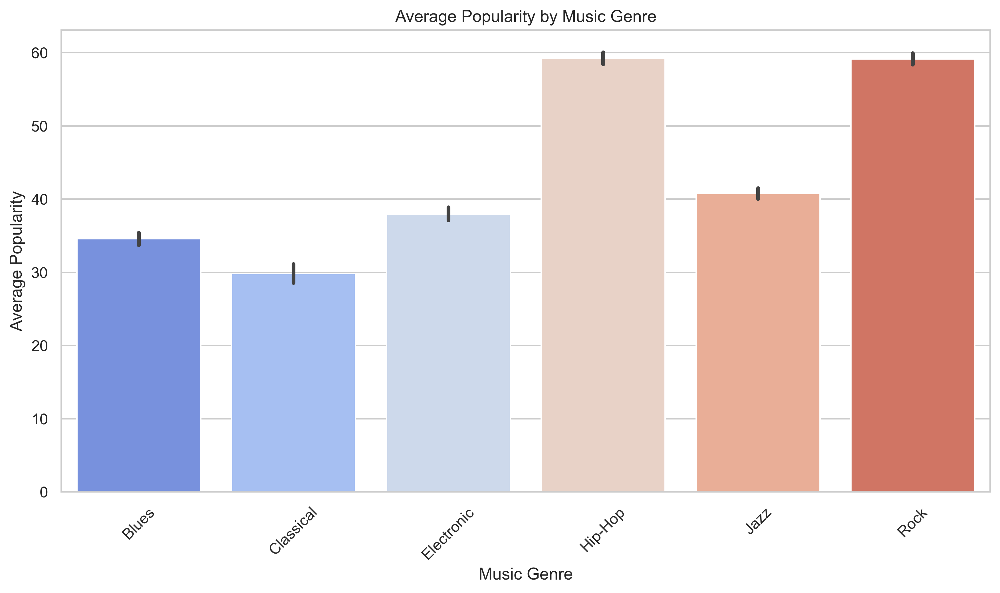

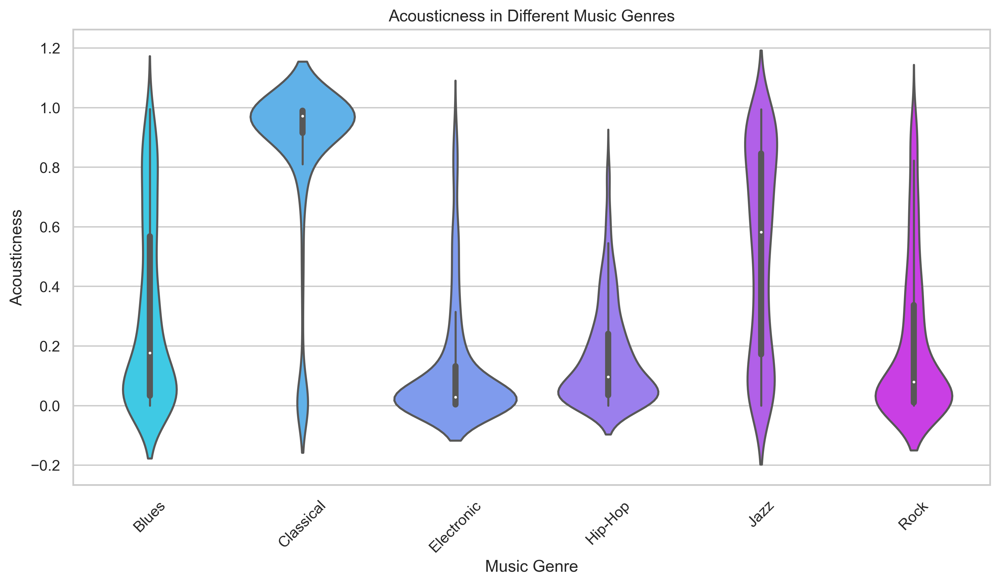

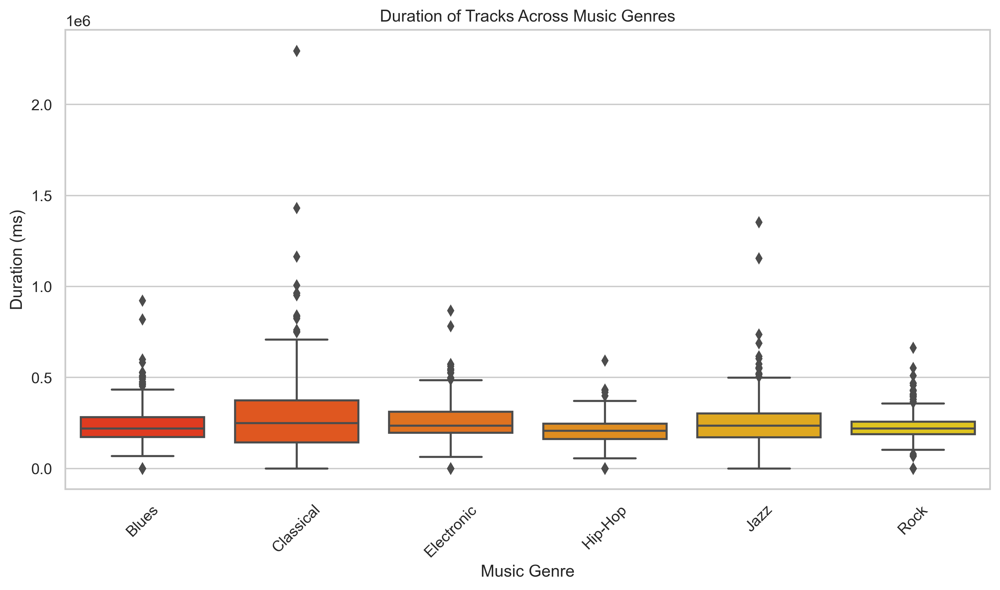

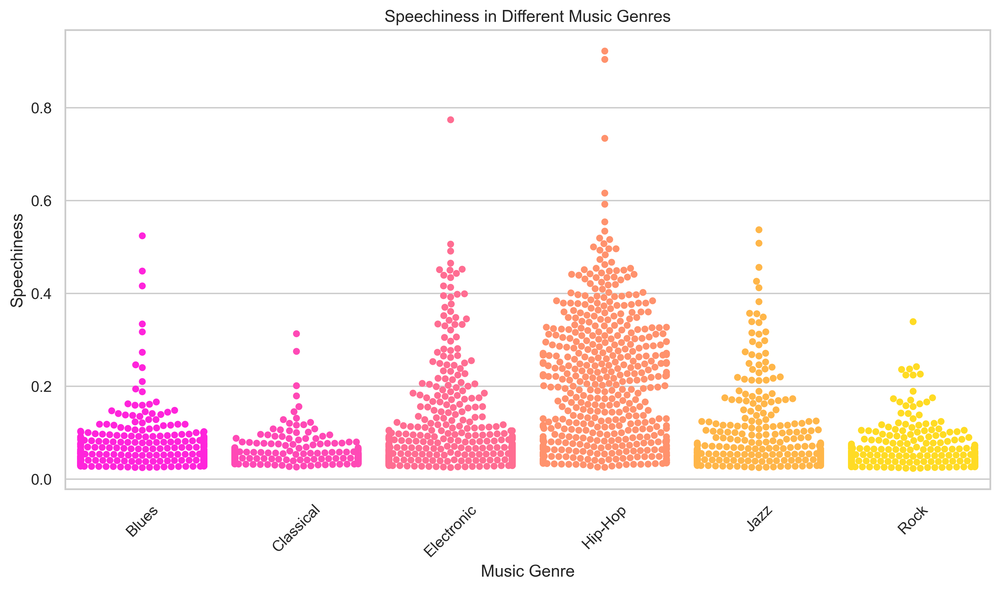

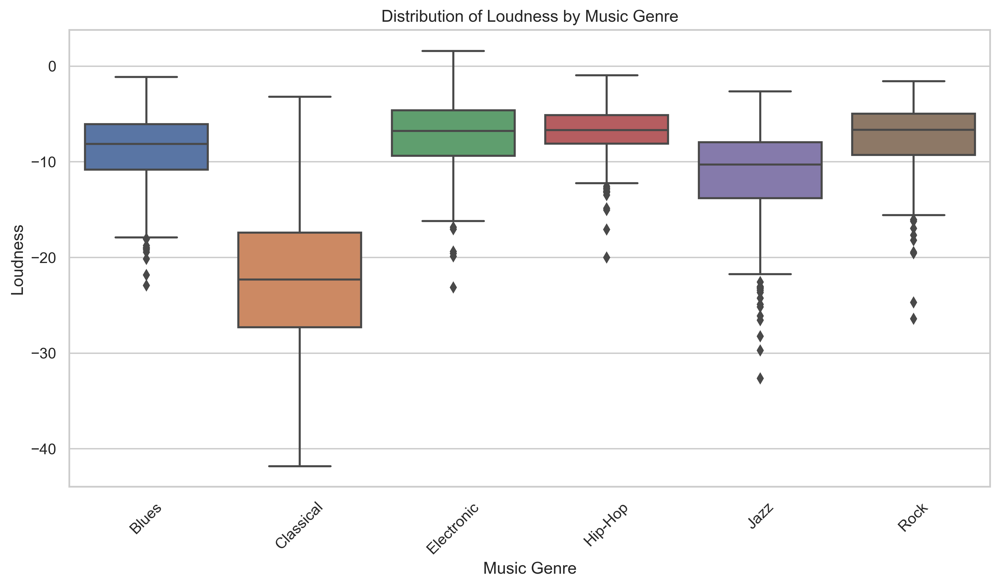

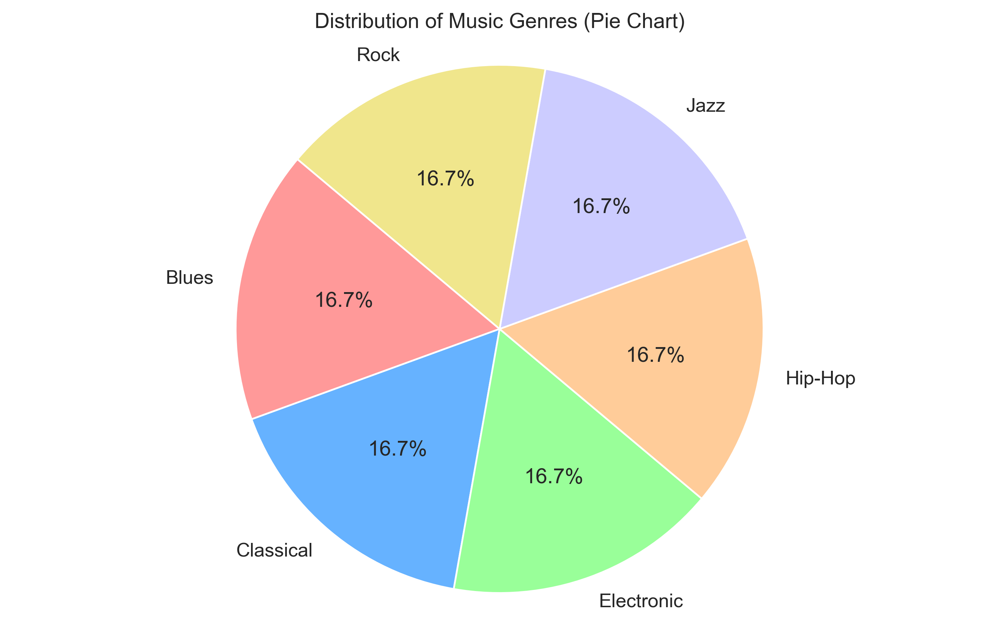

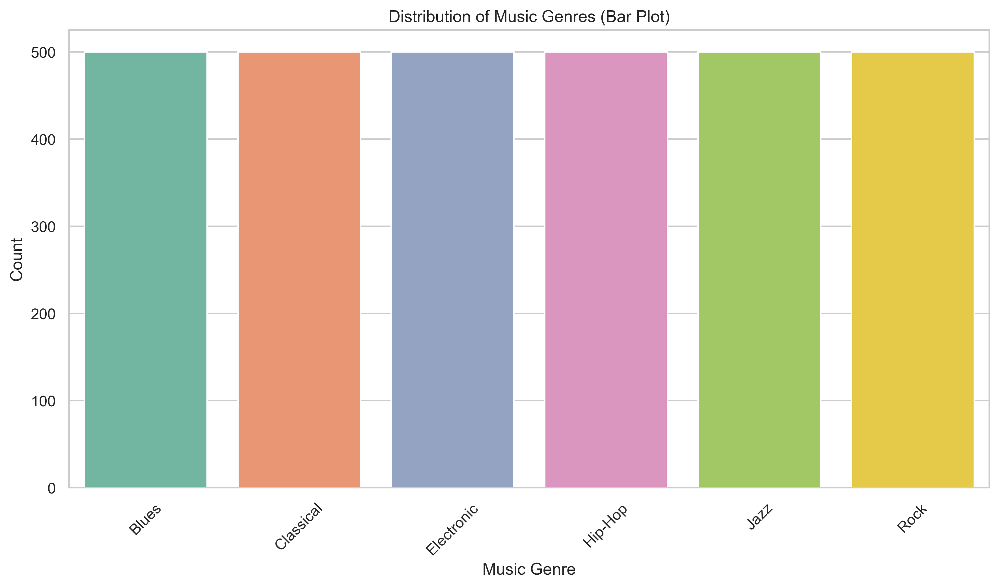

In [7]:
# Average Popularity by Music Genre (Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='music_genre', y='popularity', data=music_df, palette='coolwarm')
plt.xticks(rotation=45)
plt.title('Average Popularity by Music Genre')
plt.xlabel('Music Genre')
plt.ylabel('Average Popularity')
plt.show()

# Acousticness in Different Music Genres (Violin Plot)
plt.figure(figsize=(12, 6))
sns.violinplot(x='music_genre', y='acousticness', data=music_df, palette='cool')
plt.xticks(rotation=45)
plt.title('Acousticness in Different Music Genres')
plt.xlabel('Music Genre')
plt.ylabel('Acousticness')
plt.show()

# Duration of Tracks Across Music Genres (Box Plot)
plt.figure(figsize=(12, 6))
sns.boxplot(x='music_genre', y='duration_ms', data=music_df, palette='autumn')
plt.xticks(rotation=45)
plt.title('Duration of Tracks Across Music Genres')
plt.xlabel('Music Genre')
plt.ylabel('Duration (ms)')
plt.show()

# Speechiness in Different Music Genres (Swarm Plot)
# A swarmplot displays each data point as a point on a graph, with points representing values of the categorical variable and their positions representing the corresponding numerical values. Swarmplots are particularly useful when you want to see how the distribution of data points changes across different categories.
plt.figure(figsize=(12, 6))
sns.swarmplot(x='music_genre', y='speechiness', data=music_df, palette='spring')
plt.xticks(rotation=45)
plt.title('Speechiness in Different Music Genres')
plt.xlabel('Music Genre')
plt.ylabel('Speechiness')
plt.show()

# Box Plot for loudness by Genre
plt.figure(figsize=(12, 6))
sns.boxplot(x='music_genre', y='loudness', data=music_df)
plt.xticks(rotation=45)
plt.title('Distribution of Loudness by Music Genre')
plt.xlabel('Music Genre')
plt.ylabel('Loudness')
plt.show()

# Pie Chart for Genre Distribution
plt.figure(figsize=(10, 6))
genre_counts = music_df['music_genre'].value_counts()
colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#CCCCFF', '#F0E68C']
plt.pie(genre_counts, labels=genre_counts.index, autopct='%1.1f%%', startangle=140,colors=colors)
plt.title('Distribution of Music Genres (Pie Chart)')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular
plt.show()

# Bar Plot for Genre Distribution(if you want)
plt.figure(figsize=(12, 6))
sns.countplot(x='music_genre', data=music_df, palette='Set2')
plt.xticks(rotation=45)
plt.title('Distribution of Music Genres (Bar Plot)')
plt.xlabel('Music Genre')
plt.ylabel('Count')
plt.show()

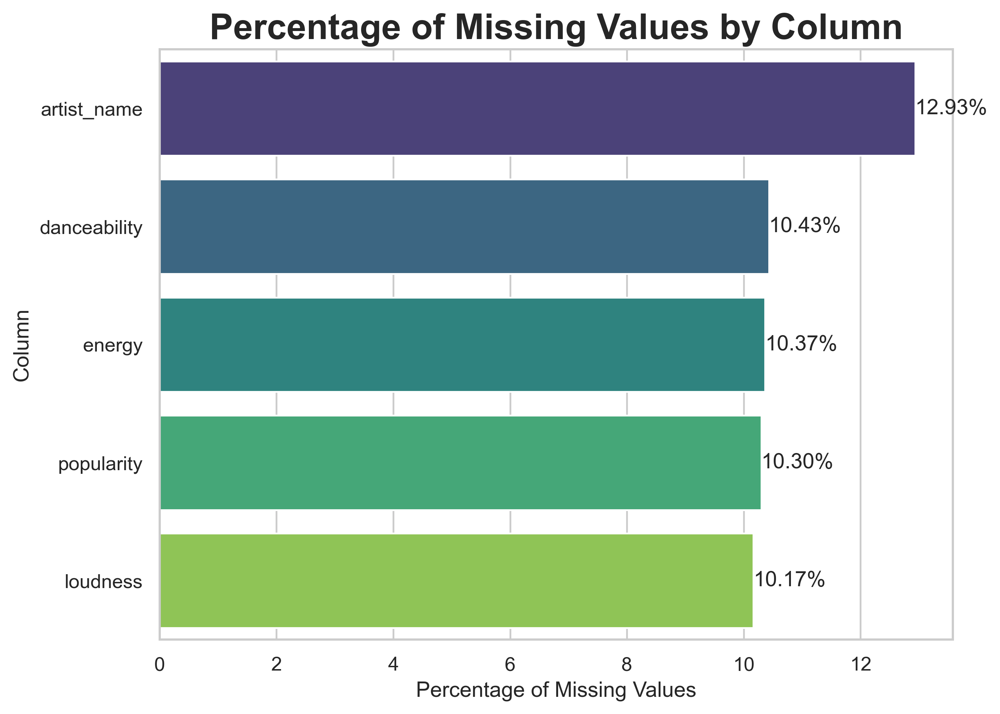

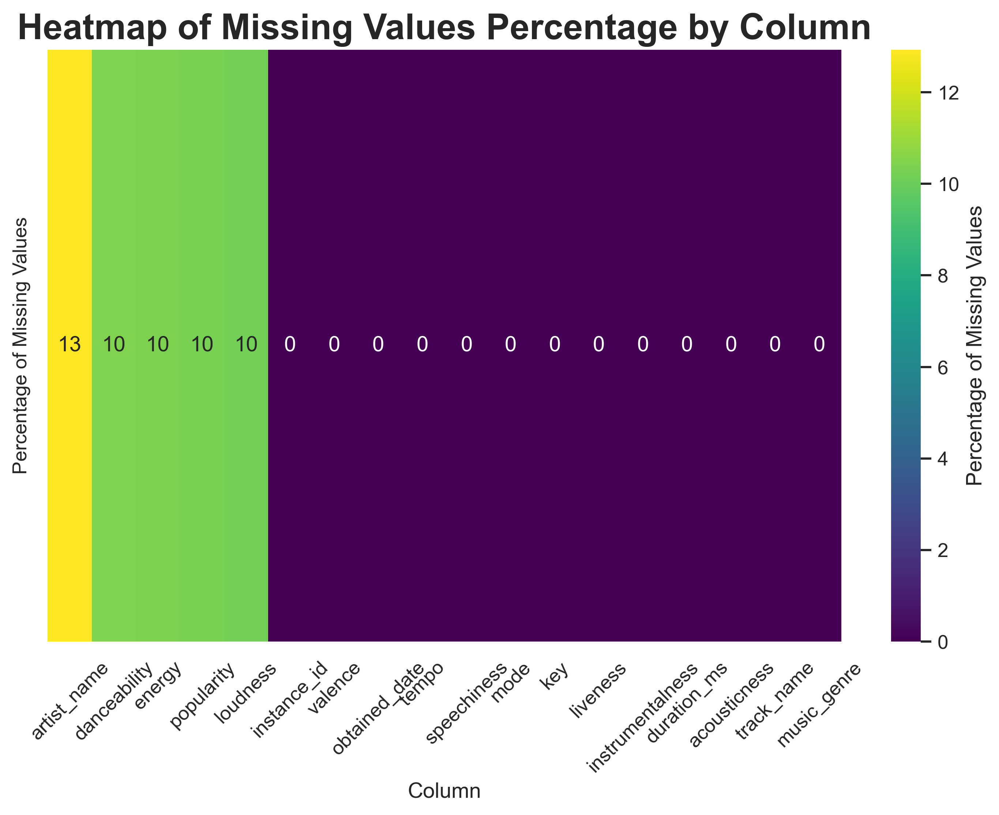

In [8]:
#bar chart to visualize missing data
missing_values = music_df.isnull().mean().sort_values(ascending=False) * 100
print()
missing_values = missing_values[missing_values > 0]
missing_data_df = pd.DataFrame({'Column': missing_values[missing_values > 0].index.to_list(),
                                'MissingPercentage': missing_values}).reset_index(drop=True)

# Plotting missing data percentages
plt.figure(figsize=(8, 6))
sns.set(style="whitegrid", palette="muted")
ax = sns.barplot(x='MissingPercentage', y='Column', data=missing_data_df, palette='viridis')
# Annotate each bar with the percentage
for p in ax.patches:
    width = p.get_width()    # get the width of the bar
    ax.text(width + 0,     # set the text at 0.3 unit right of the bar
            p.get_y() + p.get_height() / 2, # get Y coordinate of the bar
            '{:1.2f}%'.format(width),       # format the text to be displayed
            va='center')                    # center vertically
plt.title('Percentage of Missing Values by Column',fontweight='bold',fontsize=20)
plt.xlabel('Percentage of Missing Values')
plt.ylabel('Column')
plt.show()

# heatmap to visualize missing data
missing_percentages = music_df.isnull().mean().sort_values(ascending=False) * 100

heatmap_df = pd.DataFrame(missing_percentages)
heatmap_df.rename(columns={0: 'Percentage of Missing Values'}, inplace=True)
heatmap_df = heatmap_df.T # Transpose to fit the heatmap requirements
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', cbar_kws={'label': 'Percentage of Missing Values'})
plt.title('Heatmap of Missing Values Percentage by Column',fontweight='bold',fontsize=20)
plt.xlabel('Column')
#plt.ylabel('Missing Value Percentage')
plt.xticks(rotation=45)
plt.show()

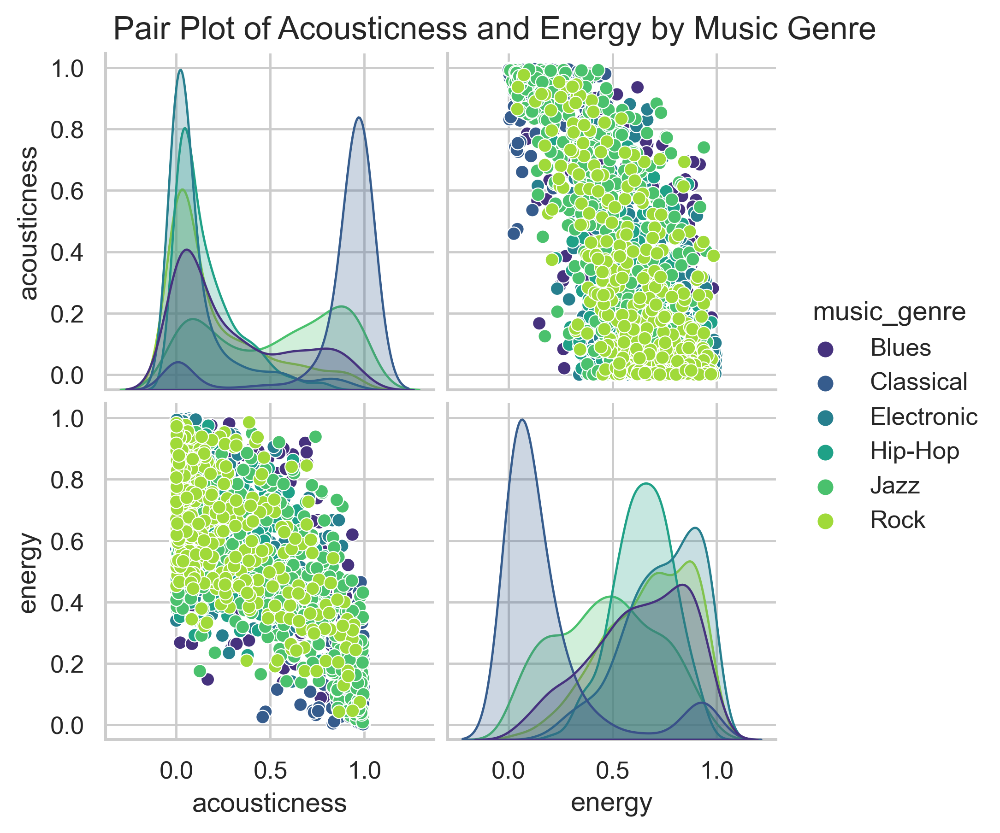

In [9]:
# Complex Visualization
# Setting aesthetic parameters
sns.pairplot(music_df, vars=['acousticness', 'energy'], hue='music_genre', palette='viridis')
plt.suptitle('Pair Plot of Acousticness and Energy by Music Genre', y=1.02)
plt.show()

- Relationship Between Acousticness and Energy: There appears to be a general trend where tracks with higher acousticness have lower energy and vice versa. This pattern is especially pronounced in genres like Classical, which has a cluster of tracks with high acousticness and low energy.

- Genre Characteristics: Hip-Hop tracks are spread out across the scatterplot, indicating a wide range of acousticness and energy levels within the genre. Classical tracks are clustered in the area of high acousticness and low energy, reflecting the genre's characteristics.

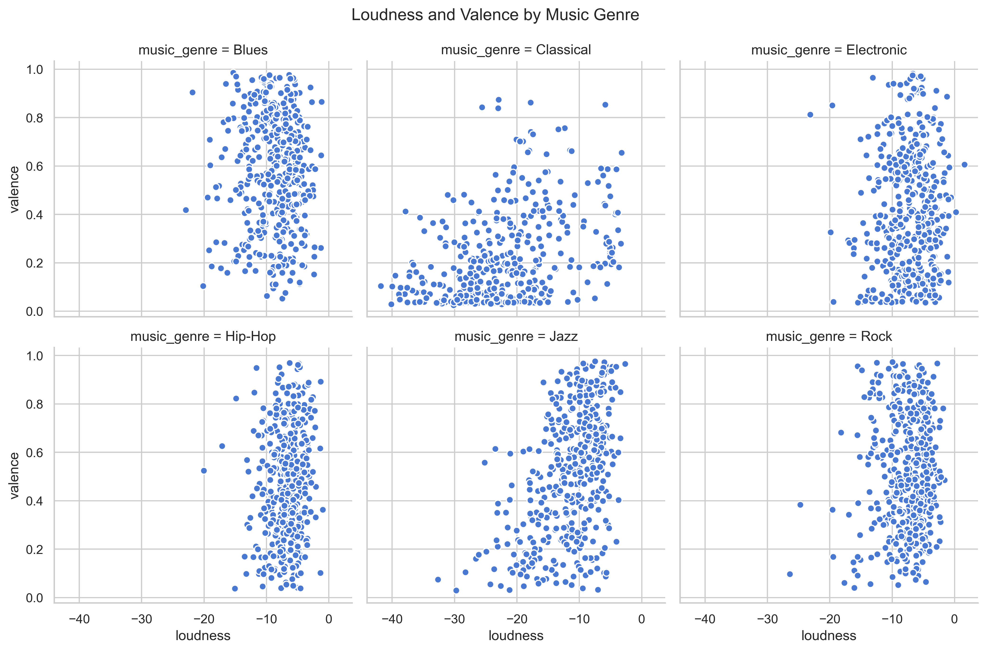

In [10]:
g = sns.FacetGrid(music_df, col='music_genre', col_wrap=3, height=4)
g = g.map(plt.scatter, 'loudness', 'valence', edgecolor="w").add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Loudness and Valence by Music Genre')
plt.show()

- There is no single, clear pattern of correlation between loudness and valence across all genres. Each genre exhibits its own characteristics.
Genres like Electronic and Rock tend to have tracks with higher loudness levels, while Classical music has a quieter profile.
- The valence varies greatly within each genre, suggesting that there's no strong dependency of the positiveness of a track on its loudness within these genres.
- This visualization helps in understanding how emotional characteristics (like the positiveness of a track) are not necessarily linked to physical characteristics (like loudness) in a consistent way across different genres of music.

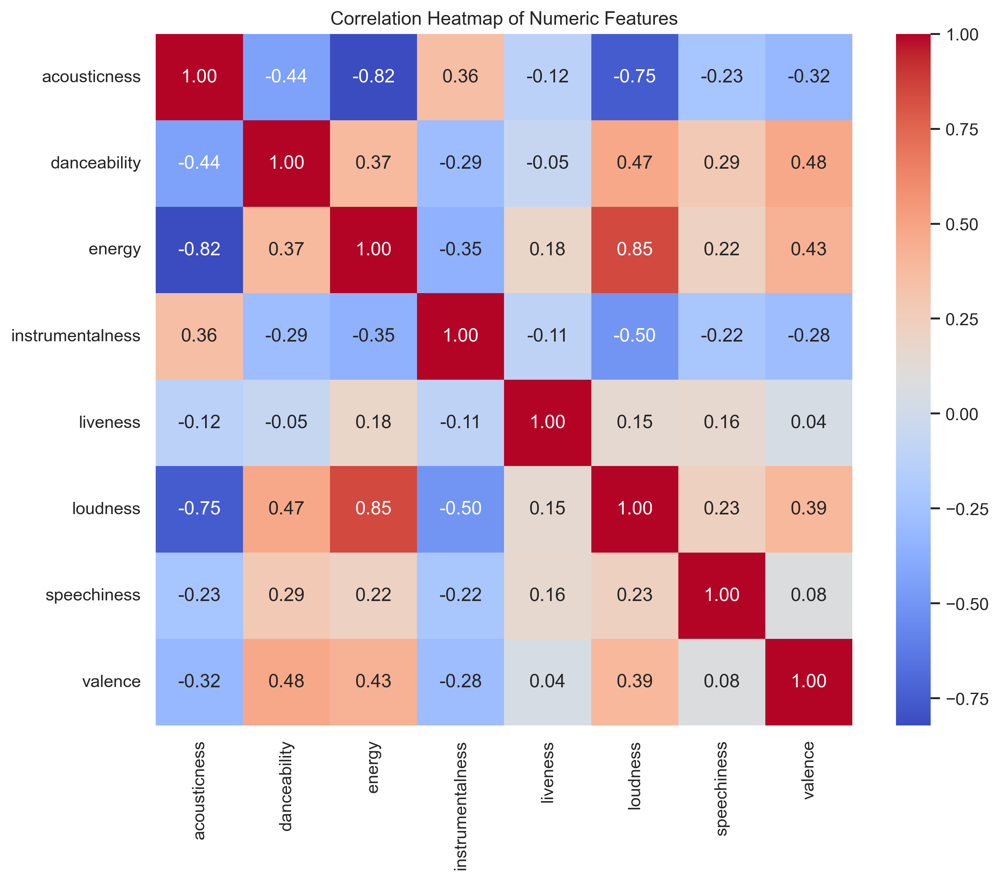

In [11]:
numeric_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'valence']
plt.figure(figsize=(10, 8))
sns.heatmap(music_df[numeric_features].corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

The correlation heatmap visualizes the relationships between various numerical features of music tracks. Acousticness has a strong negative correlation with energy (-0.82) and loudness (-0.75), suggesting that more acoustic tracks are generally quieter and less energetic. Energy and loudness are positively correlated (0.85), indicating that louder tracks are typically more energetic. Danceability shows a moderate positive correlation with valence (0.48), meaning that more danceable tracks tend to be associated with positive emotions. Instrumentalness does not have strong correlations with most other features, although it has a slight negative correlation with loudness (-0.50), which could imply that instrumental tracks are not as loud as vocal tracks

### ML pipeline

In [12]:
df.drop(columns=['instance_id', 'artist_name','track_name','obtained_date'],inplace=True)
df = df[df['duration_ms'] != -1]
df = df[df['tempo'] != '?']
df['tempo'] = df['tempo'].astype(float)

In [13]:
df.isna().sum()

popularity          261
acousticness          0
danceability        252
duration_ms           0
energy              252
instrumentalness      0
key                   0
liveness              0
loudness            255
mode                  0
speechiness           0
tempo                 0
valence               0
music_genre           0
dtype: int64

In [14]:
import pandas as pd
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestRegressor

def train_and_evaluate_models(X, y, preprocessor, model, param_grid):
    best_models = []
    test_scores = []
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X)

    for state in range(10):
        # Split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=state)
        if not isinstance(X_train, pd.DataFrame):
            X_train = pd.DataFrame(X_train)
            

        # Define the pipeline
        pipeline = Pipeline([
            #('imputer', IterativeImputer(estimator=RandomForestRegressor(), random_state=state)),
            ('imputer', IterativeImputer( random_state=state)),# or any other imputation strategy
            ('preprocessor', preprocessor),
            ('classifier', model)
        ]).set_output(transform="pandas")

        # Set up the KFold cross-validation
        kf = KFold(n_splits=4, shuffle=True, random_state=state)

        # Set up GridSearchCV
        grid_search = RandomizedSearchCV(pipeline, param_grid, cv=kf, scoring='accuracy',n_iter=100)

        # Perform cross-validation and fit the model
        grid_search.fit(X_train, y_train)

        # Save the best model and calculate test score
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        test_score = accuracy_score(y_test, y_pred)

        best_models.append(best_model)
        test_scores.append(test_score)
        print(test_score)

    return best_models, test_scores


### Random Forest

In [15]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier

y = df['music_genre']
X = df.drop('music_genre', axis=1)


ordinal_ftrs = ['key']
ordinal_cats = [['C','C#','D','D#','E', 'F', 'F#','G', 'G#','A', 'A#','B']]
enc = OrdinalEncoder(categories = ordinal_cats)
enc.fit(X[ordinal_ftrs]) 
ord_X = enc.transform(X[ordinal_ftrs])
X['key_ord']=ord_X
X.drop(columns=['key'],inplace=True)


X = pd.get_dummies(X, columns = ['mode']) 

# Define the preprocessing steps
std_ftrs = ['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
preprocessor = ColumnTransformer(transformers=[('std', StandardScaler(), std_ftrs)])

# Initialize the model
model = RandomForestClassifier()

# Define the parameter grid
param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_features': ['auto', 'sqrt'],
    'classifier__max_depth': [5,10,20,30,100],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__bootstrap': [True, False]
}



# Run the function
best_models_RF, test_scores_RF = train_and_evaluate_models(X, y, preprocessor, model, param_grid)

0.6910569105691057
0.7012195121951219
0.7195121951219512
0.676829268292683
0.6971544715447154
0.7195121951219512
0.7052845528455285
0.6971544715447154
0.7215447154471545
0.6991869918699187


In [16]:
test_scores_RF

[0.6910569105691057,
 0.7012195121951219,
 0.7195121951219512,
 0.676829268292683,
 0.6971544715447154,
 0.7195121951219512,
 0.7052845528455285,
 0.6971544715447154,
 0.7215447154471545,
 0.6991869918699187]

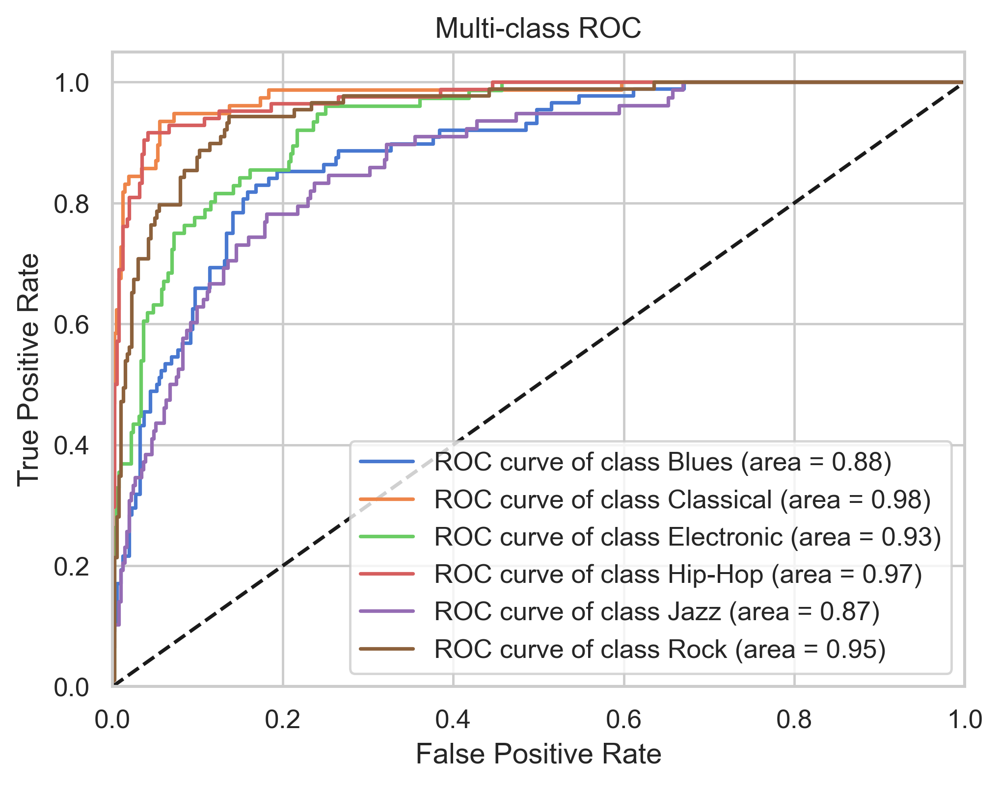

In [17]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
import numpy as np

# Select the best model
# Example: Selecting the model with the highest test score
best_model_index = np.argmax(test_scores_RF)
best_model = best_models_RF[best_model_index]

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
# Binarize the output for multi-class ROC and AUC
y_binarized = label_binarize(y, classes=label_encoder.classes_)
n_classes = y_binarized.shape[1]

# Split the data (using the same random state as the best model for consistency)
X_train, X_test, y_train, y_test = train_test_split(X, y_binarized, test_size=0.2, random_state=best_model_index)
y_test_binarized = label_binarize(y_test, classes=label_encoder.classes_)

# Compute predicted probabilities
y_score = best_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plotting all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {label_encoder.classes_[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC')
plt.legend(loc="lower right")
plt.show()

### logistic regression

In [18]:
from sklearn.linear_model import LogisticRegression

# Initialize the Logistic Regression model
logistic_model = LogisticRegression()

# Define the parameter grid for Logistic Regression
logistic_param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['l2'],
    'classifier__solver': ['saga']
}

# Run the function with Logistic Regression
best_models_LR, test_scores_LR = train_and_evaluate_models(X, y, preprocessor, logistic_model, logistic_param_grid)

0.6626016260162602
0.6788617886178862
0.6747967479674797
0.6626016260162602
0.7032520325203252
0.6991869918699187
0.6890243902439024
0.6910569105691057
0.6910569105691057
0.7032520325203252


### SVC

In [19]:
from sklearn.svm import SVC
# Initialize the SVC model
svc_model = SVC(probability=True)

# Define the parameter grid for SVC
svc_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__kernel': ['linear', 'rbf', 'poly'],
    'classifier__gamma': ['scale', 'auto']
}

# Run the function with SVC
best_models_SVC, test_scores_SVC = train_and_evaluate_models(X, y, preprocessor, svc_model, svc_param_grid)

0.6910569105691057
0.6829268292682927
0.7012195121951219
0.6646341463414634
0.7215447154471545
0.7113821138211383
0.7276422764227642
0.6910569105691057
0.7032520325203252
0.7052845528455285


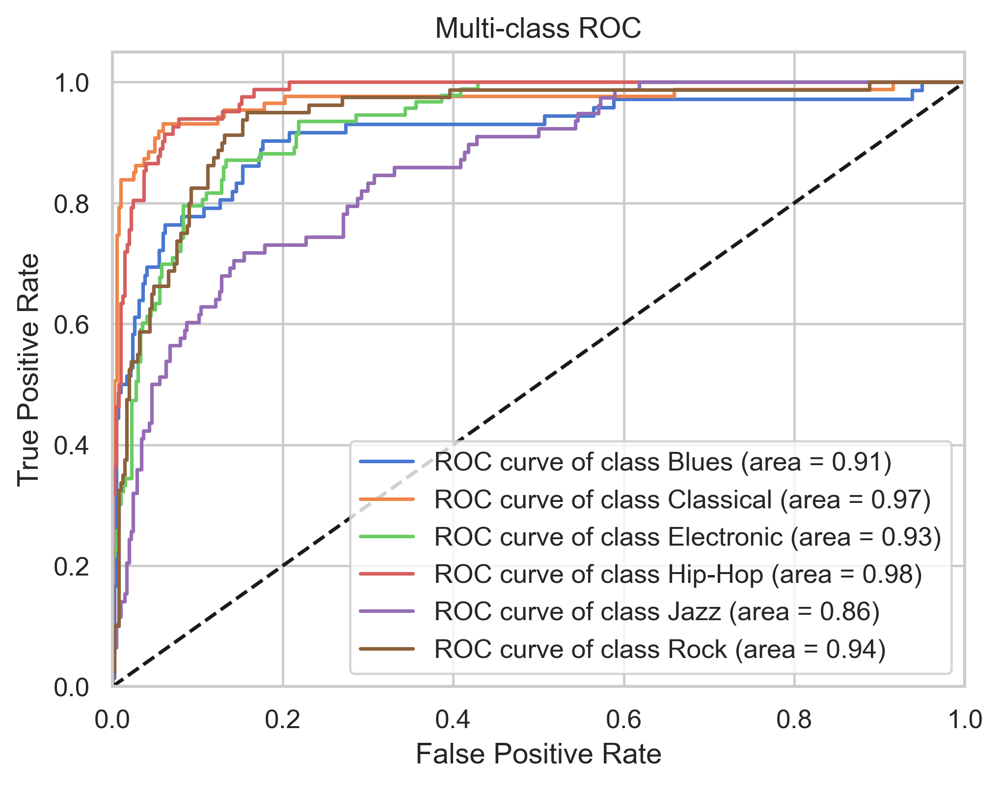

In [20]:
# Select the best model
# Example: Selecting the model with the highest test score
best_model_index = np.argmax(test_scores_SVC)
best_model = best_models_SVC[best_model_index]

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
# Binarize the output for multi-class ROC and AUC
y_binarized = label_binarize(y, classes=label_encoder.classes_)
n_classes = y_binarized.shape[1]

# Split the data (using the same random state as the best model for consistency)
X_train, X_test, y_train, y_test = train_test_split(X, y_binarized, test_size=0.2, random_state=best_model_index)
y_test_binarized = label_binarize(y_test, classes=label_encoder.classes_)

# Compute predicted probabilities
y_score = best_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plotting all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {label_encoder.classes_[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC')
plt.legend(loc="lower right")
plt.show()

### XGBoost

In [21]:
def train_and_evaluate_models_XGB(X, y, preprocessor, model, param_grid):
    best_models = []
    test_scores = []
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X)

    for state in range(10):
        # Split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=state)
        if not isinstance(X_train, pd.DataFrame):
            X_train = pd.DataFrame(X_train)
            
        

        # Define the pipeline
        pipeline = Pipeline([
            ('preprocessor', preprocessor),
            ('classifier', model)
        ]).set_output(transform="pandas")

        # Set up the KFold cross-validation
        kf = KFold(n_splits=4, shuffle=True, random_state=state)

        # Set up GridSearchCV
        grid_search = RandomizedSearchCV(pipeline, param_grid, cv=kf, scoring='accuracy')

        # Perform cross-validation and fit the model
        grid_search.fit(X_train, y_train)

        # Save the best model and calculate test score
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        test_score = accuracy_score(y_test, y_pred)

        best_models.append(best_model)
        test_scores.append(test_score)
        print(test_score)
        # Extract the classifier from the pipeline
        # Assuming the name of the last step in your pipeline is 'classifier'
        classifier = best_model.named_steps['classifier']

        # Create the SHAP explainer using the extracted classifier
        explainer = shap.Explainer(classifier)

        # You need to transform the X_test data through the preprocessing steps of the pipeline before passing it to SHAP
        # Assuming the name of the preprocessing step in your pipeline is 'preprocessor'
        preprocessor = best_model.named_steps['preprocessor']
        X_test_transformed = preprocessor.transform(X_test)

        # Generating SHAP values
        shap_values = explainer.shap_values(X_test_transformed)

        # Plotting the SHAP feature importance summary plot
        shap.summary_plot(shap_values, X_test_transformed, plot_type="bar")
        
        data_point_index = 0
        selected_data_point = X_test_transformed[data_point_index:data_point_index+1]

        shap_values_for_data_point = explainer.shap_values(selected_data_point)

        # Choose the class index for which you want to plot SHAP values
        # For example, using class index 0
        class_index = 1
        shap_values_for_selected_class = shap_values_for_data_point[class_index]

        # Plotting the SHAP force plot for the selected data point for the chosen class
        shap.initjs()  # Initialize JavaScript visualization library
        force_plot=shap.force_plot(explainer.expected_value[class_index], shap_values_for_selected_class, selected_data_point)
        shap.save_html('force_plot.html', force_plot)

        plt.show()

    return best_models, test_scores

0.7154471544715447


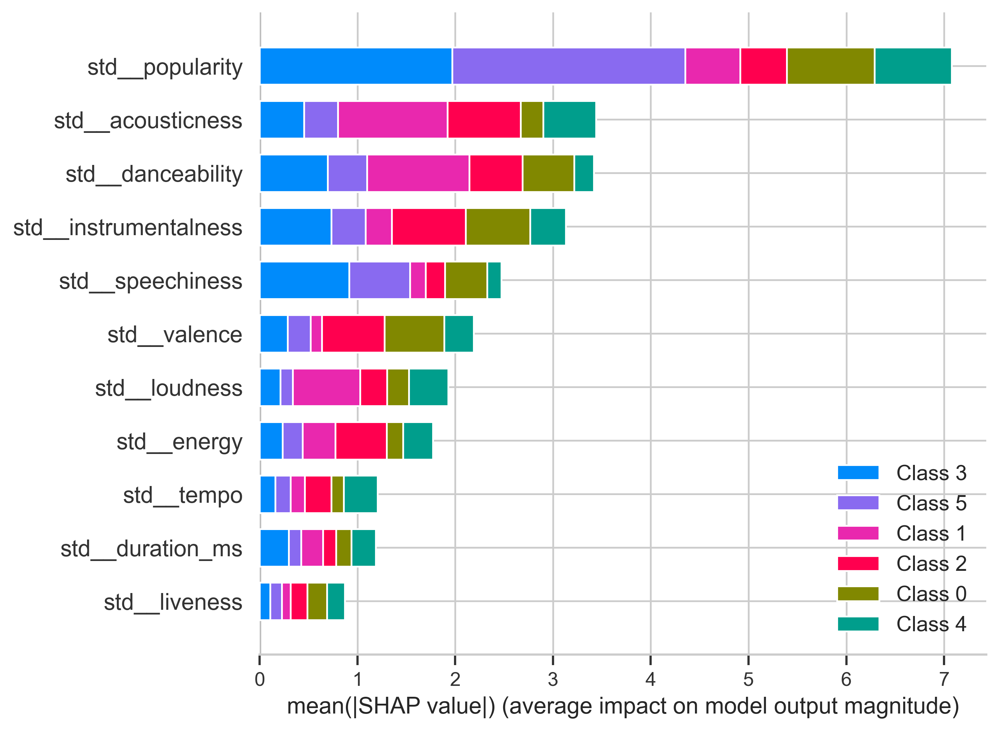

0.7195121951219512


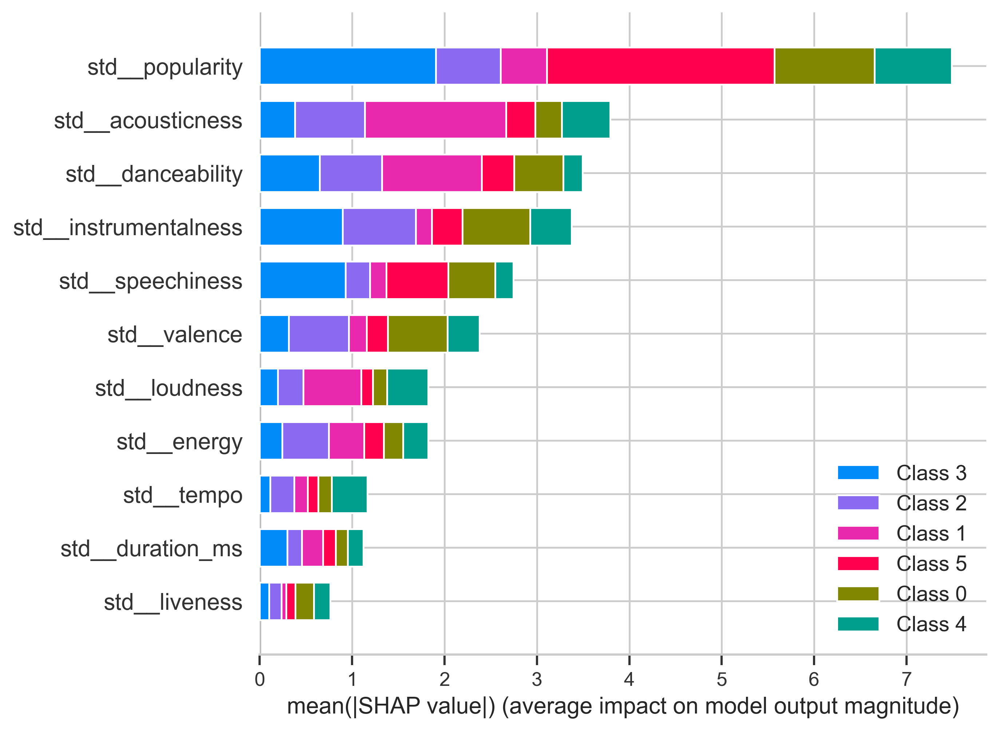

0.7378048780487805


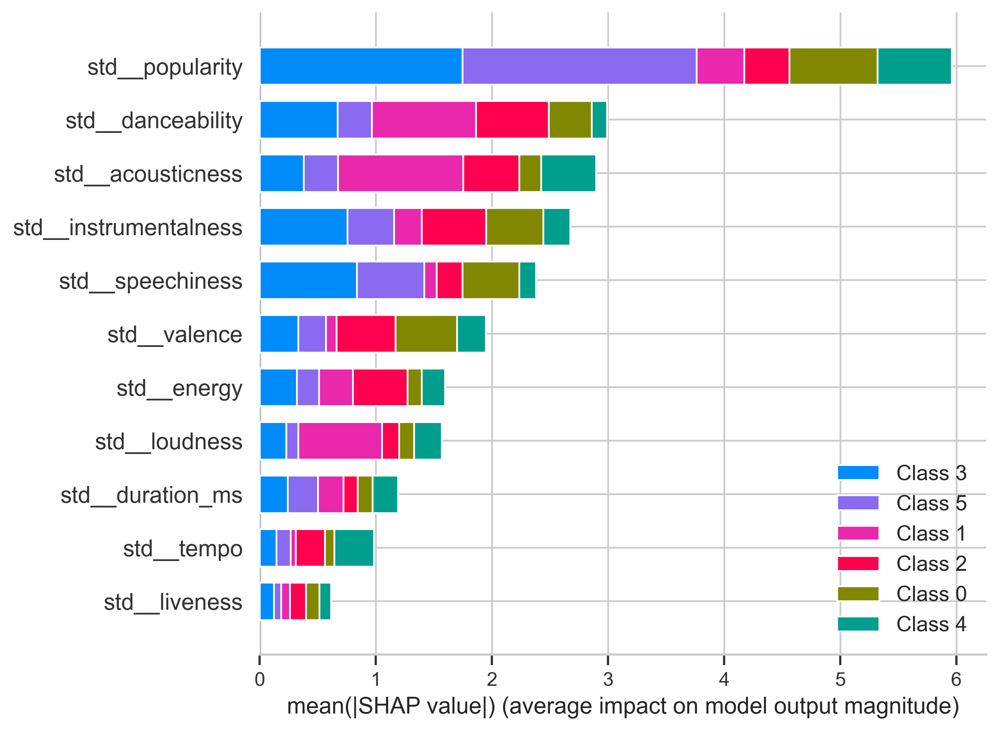

0.6890243902439024


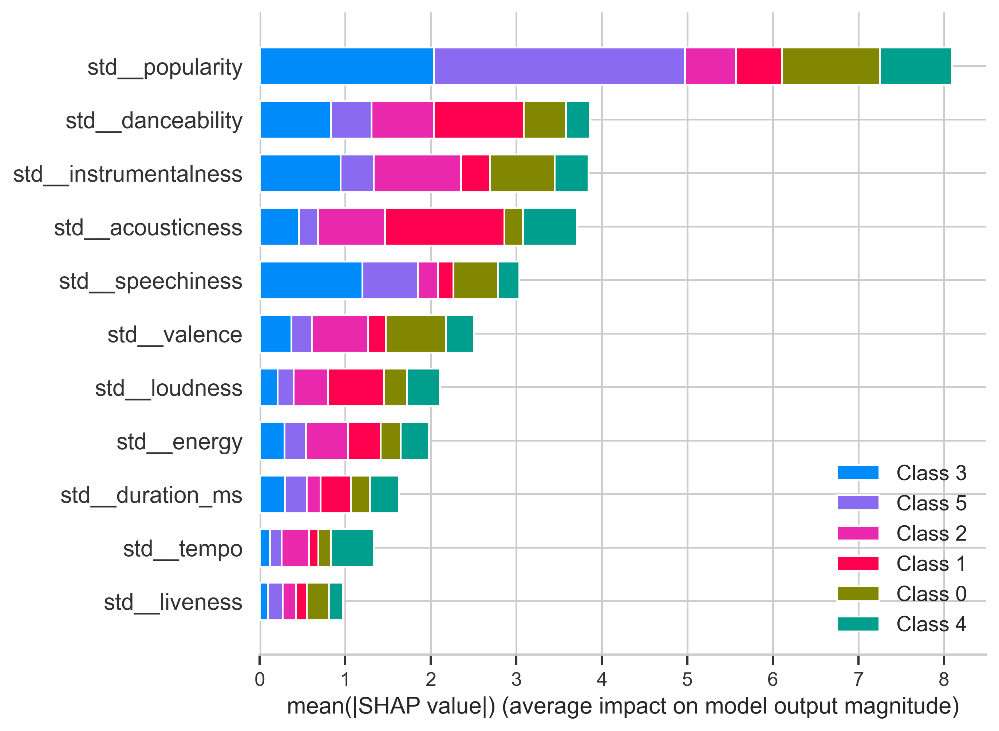

0.7235772357723578


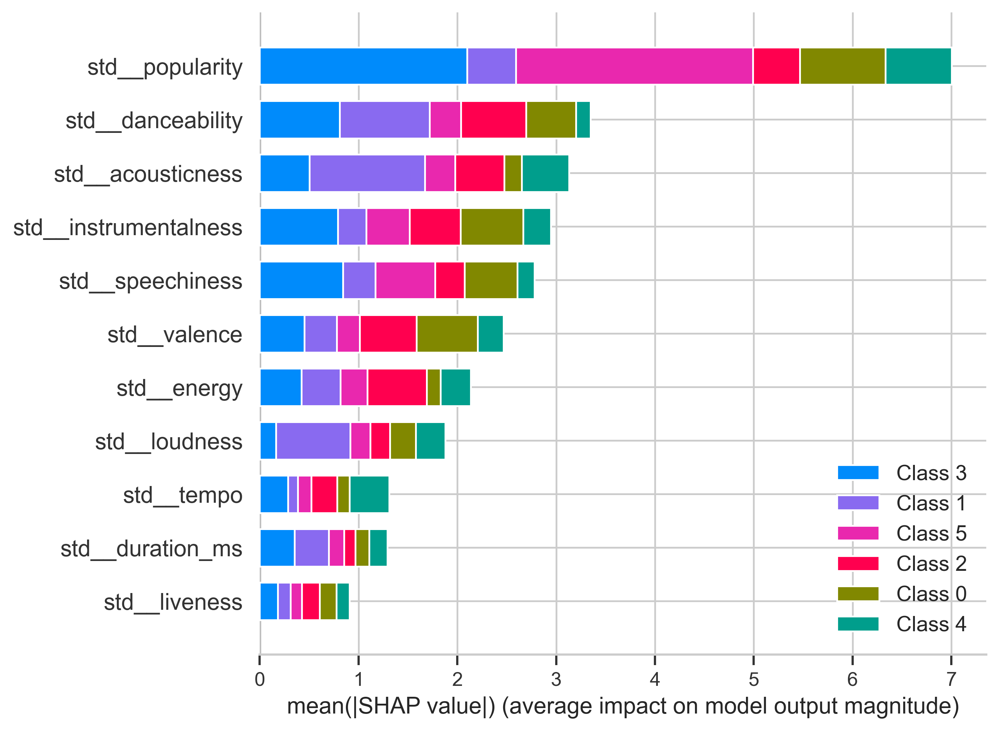

0.6991869918699187


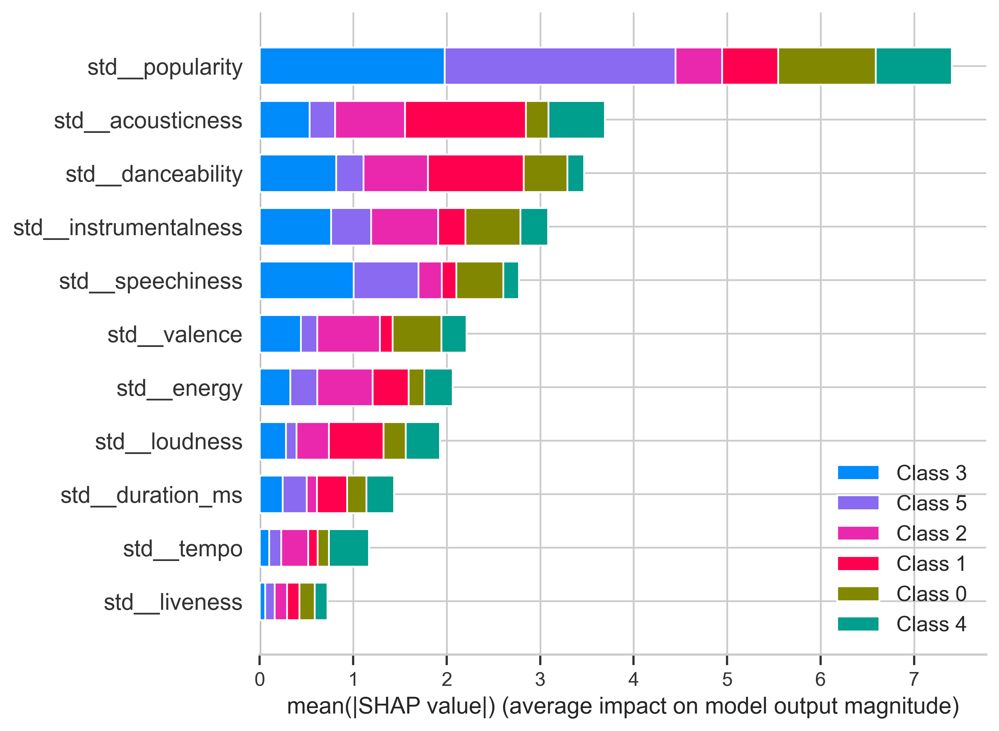

0.7012195121951219


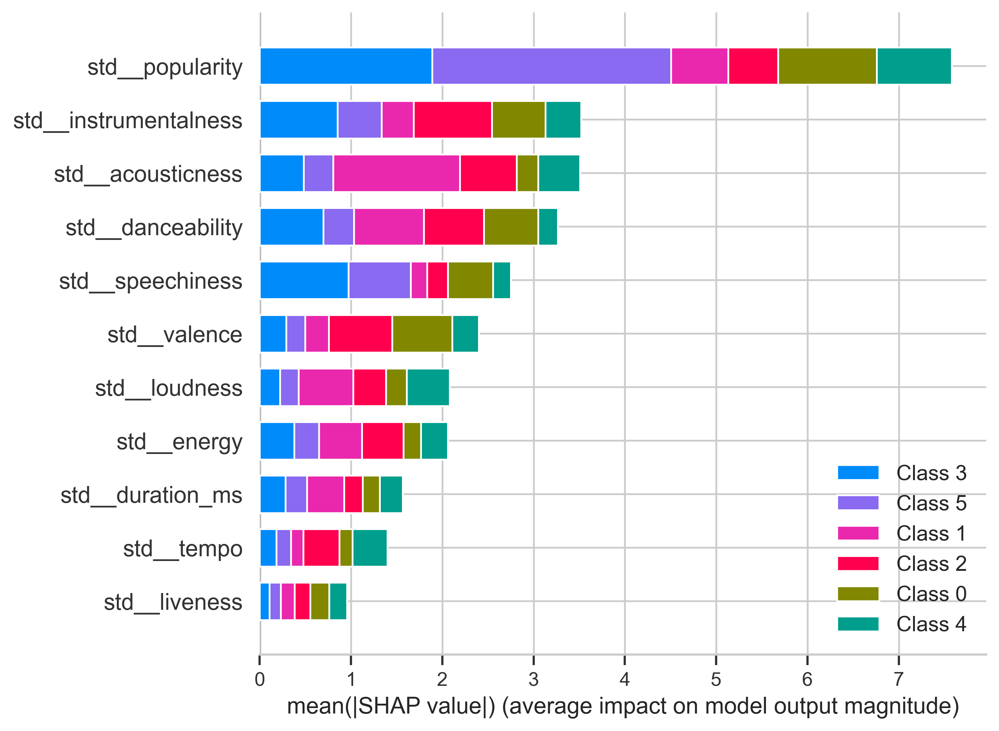

0.7113821138211383


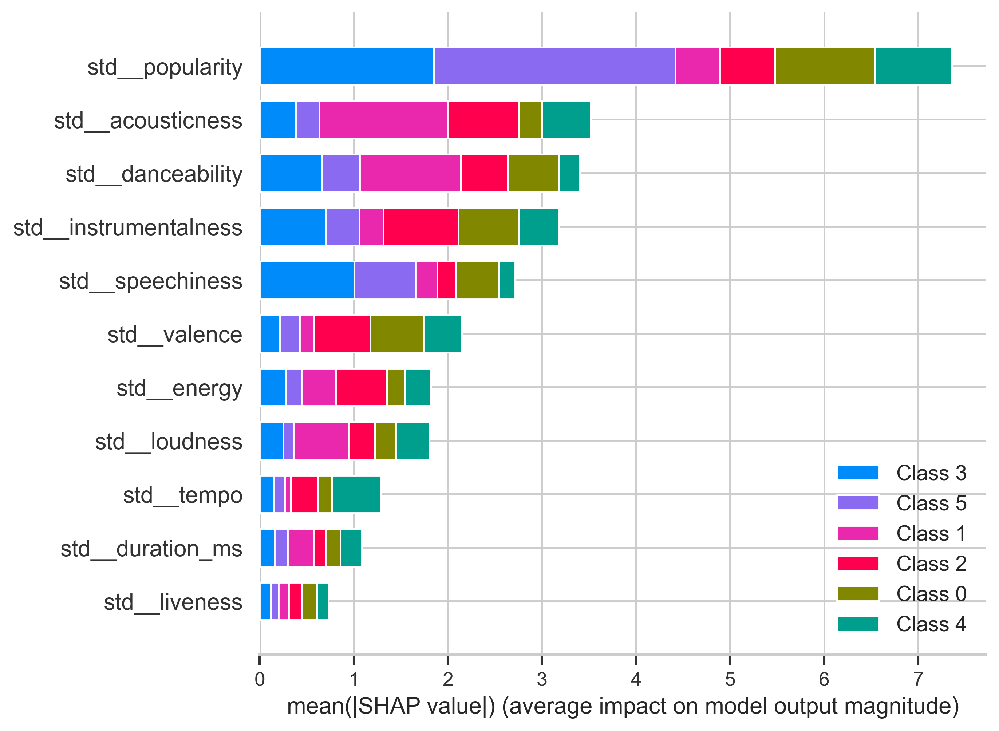

0.725609756097561


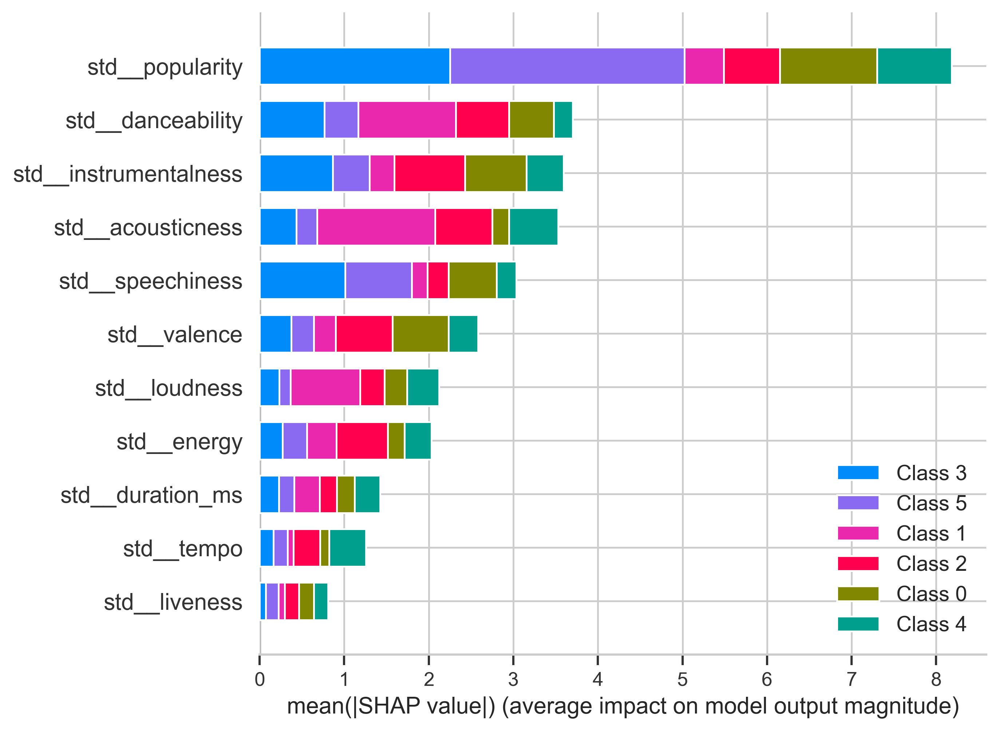

0.7195121951219512


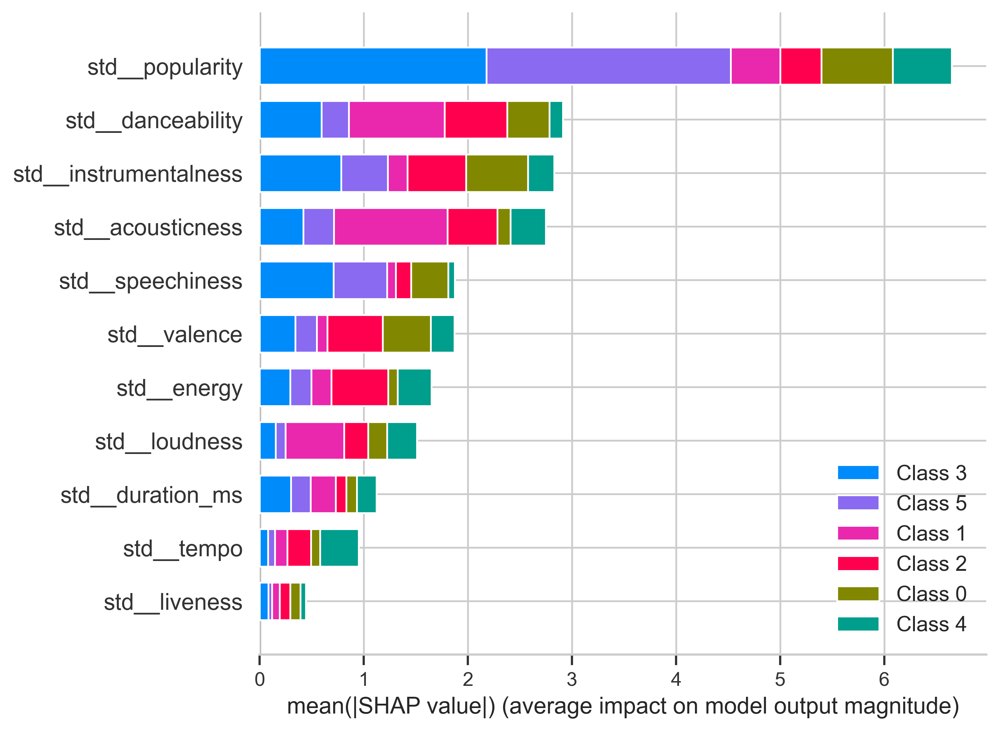

In [22]:
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
import shap

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

model = XGBClassifier()

param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 6, 10],
    'classifier__min_child_weight': [1, 2, 4],
    'classifier__subsample': [0.7, 0.8, 0.9],
    'classifier__colsample_bytree': [0.7, 0.8, 0.9]
}

# Run the function with XGBoost
best_models_XGB, test_scores_XGB = train_and_evaluate_models_XGB(X, y_encoded, preprocessor, model, param_grid)

In [23]:
label_mapping = dict(zip(label_encoder.classes_, range(len(label_encoder.classes_))))

# Print the mapping
print(label_mapping)

{'Blues': 0, 'Classical': 1, 'Electronic': 2, 'Hip-Hop': 3, 'Jazz': 4, 'Rock': 5}


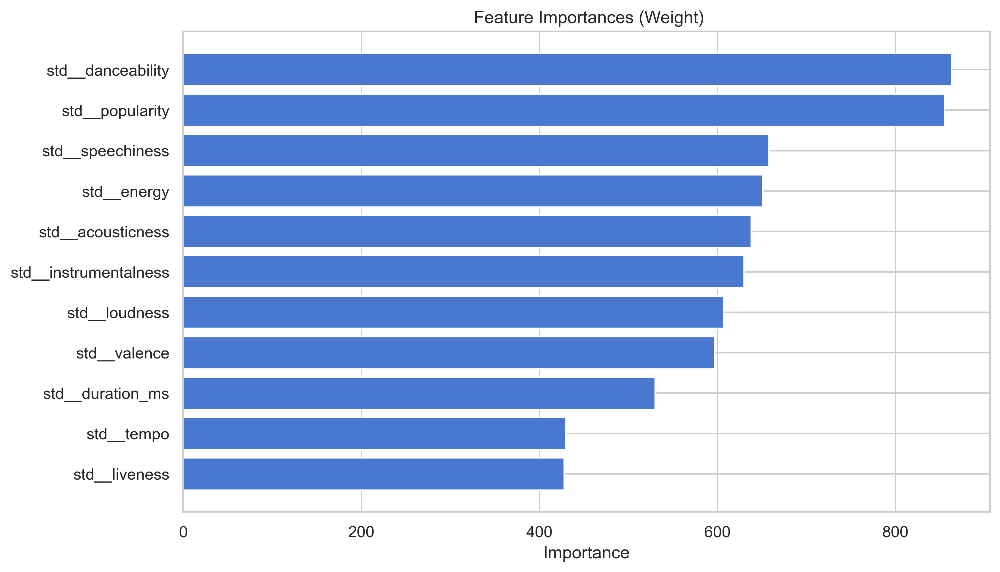

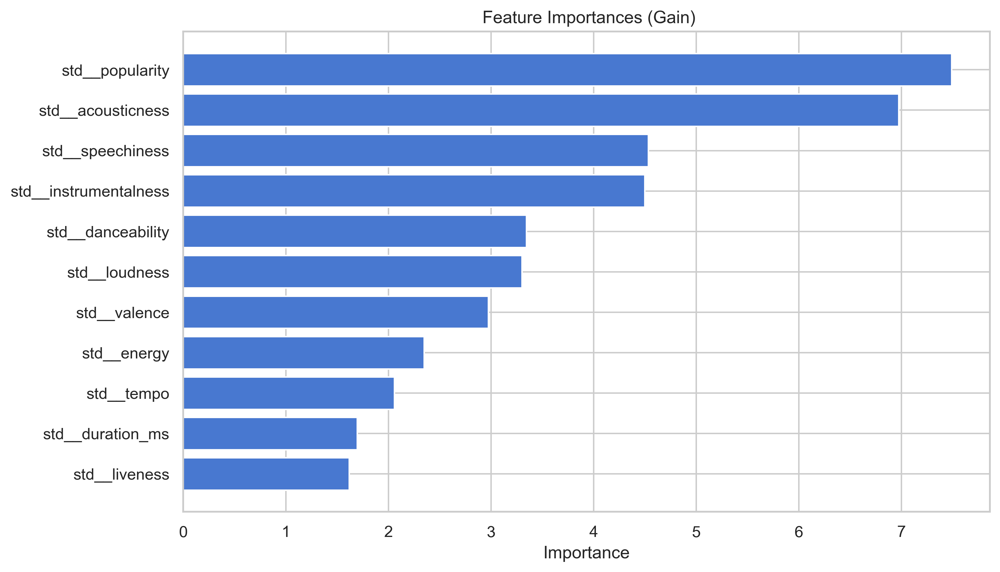

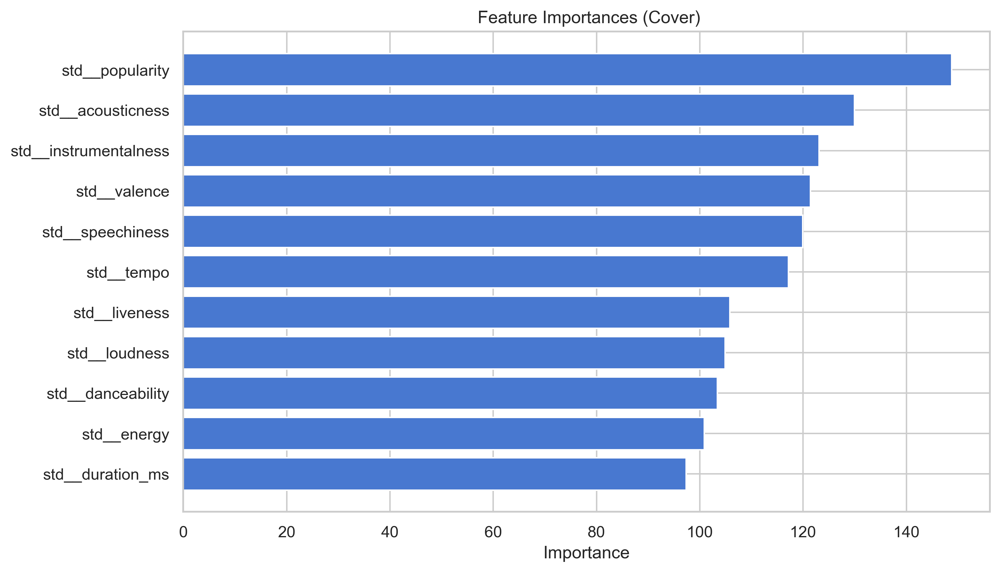

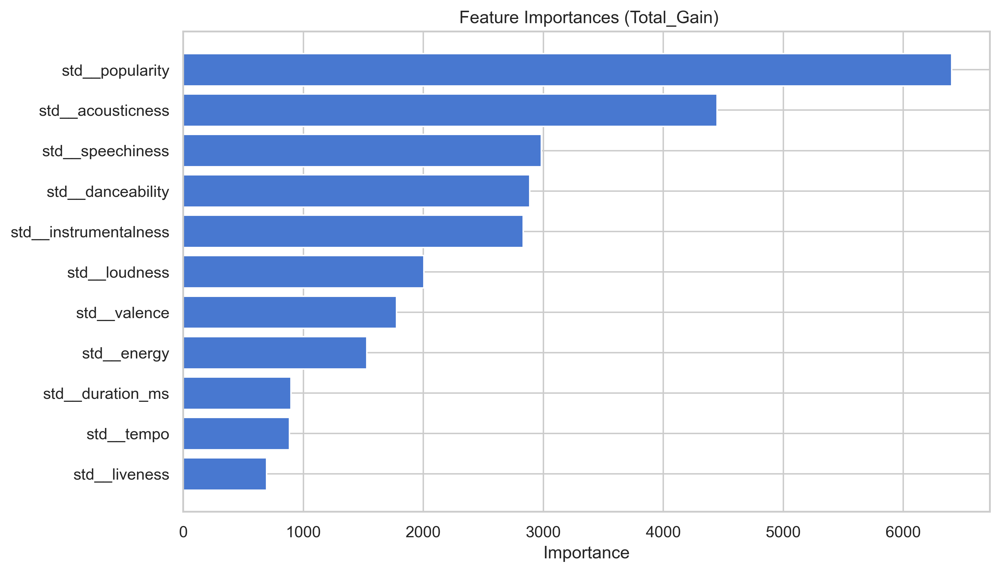

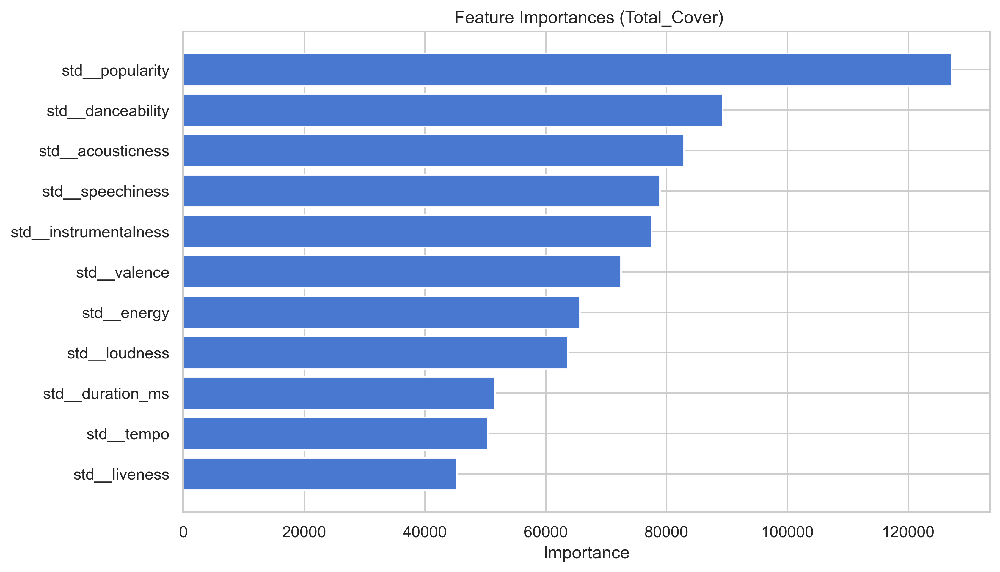

In [24]:
import matplotlib.pyplot as plt
def plot_top_10_xgboost_importances(model, importance_type):
    importances = model.get_booster().get_score(importance_type=importance_type)
    
    sorted_features = sorted(importances.items(), key=lambda x: x[1], reverse=True)
    features = []
    values = []
    for feature, value in sorted_features:
        features.append(feature)
        values.append(value)

    plt.figure(figsize=(10, 6))
    plt.barh(range(len(features)), values, align='center')
    plt.yticks(range(len(features)), features)
    plt.gca().invert_yaxis()
    plt.xlabel('Importance')
    plt.title(f" Feature Importances ({importance_type.title()})")
    plt.show()

    
importance_types = ['weight', 'gain', 'cover', 'total_gain', 'total_cover']
for imp_type in importance_types:
    plot_top_10_xgboost_importances(best_models_XGB[2].named_steps['classifier'], imp_type)

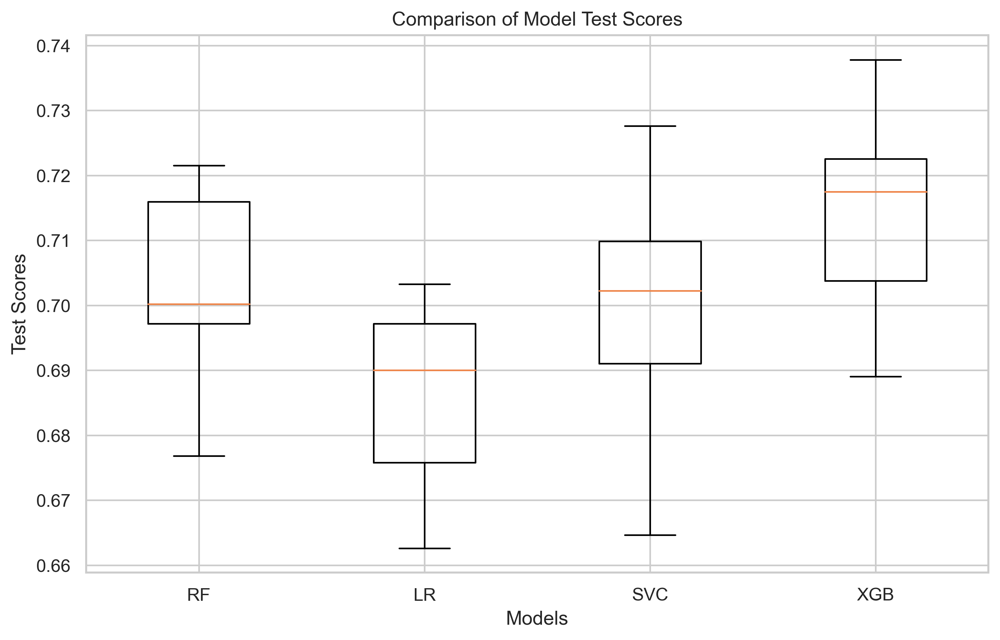

In [25]:
data_to_plot = [test_scores_RF, test_scores_LR, test_scores_SVC, test_scores_XGB]
labels = ['RF', 'LR', 'SVC', 'XGB']

# Create a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot, labels=labels)
plt.title('Comparison of Model Test Scores')
plt.ylabel('Test Scores')
plt.xlabel('Models')
plt.grid(True)
plt.show()

In [28]:
import joblib 

# save model with joblib 
joblib.dump(best_models_XGB[2], 'bst_model_XGB.sav')

['bst_model_XGB.sav']

In [29]:
joblib.dump(best_models_RF[8], 'bst_model_RF.sav')

['bst_model_RF.sav']

In [30]:
joblib.dump(best_models_LR[9], 'bst_model_LR.sav')

['bst_model_LR.sav']

In [31]:
joblib.dump(best_models_SVC[6], 'bst_model_SVC.sav')

['bst_model_SVC.sav']